In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [3]:
listings=pd.read_csv("https://raw.githubusercontent.com/rickfontenot/airbnb/main/airbnb_nyc_listings.csv?token=ARN5NNHQQO5DGH6T72FBV2DBGD342")

In [4]:
listings_reduced = listings[['id', 'host_id', 
       'host_name', 'host_since', 
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', #'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'has_availability',
       'availability_30', 'availability_60', 'availability_90',
       'availability_365', 'number_of_reviews',
       'number_of_reviews_ltm', 'number_of_reviews_l30d', 'first_review',
       'last_review', 'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', #'license', 
       'instant_bookable',
       'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_count_private_rooms',
       'calculated_host_listings_count_shared_rooms', 'reviews_per_month']]

listings_reduced.shape


(36724, 58)

In [5]:
listings_reduced.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36724 entries, 0 to 36723
Data columns (total 58 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            36724 non-null  int64  
 1   host_id                                       36724 non-null  int64  
 2   host_name                                     36701 non-null  object 
 3   host_since                                    36701 non-null  object 
 4   host_response_time                            21048 non-null  object 
 5   host_response_rate                            21048 non-null  object 
 6   host_acceptance_rate                          21538 non-null  object 
 7   host_is_superhost                             36701 non-null  object 
 8   host_neighbourhood                            29853 non-null  object 
 9   host_listings_count                           36701 non-null 

In [6]:
listings_reduced.isna().sum()

id                                                  0
host_id                                             0
host_name                                          23
host_since                                         23
host_response_time                              15676
host_response_rate                              15676
host_acceptance_rate                            15186
host_is_superhost                                  23
host_neighbourhood                               6871
host_listings_count                                23
host_total_listings_count                          23
host_verifications                                  0
host_has_profile_pic                               23
host_identity_verified                             23
neighbourhood                                   14132
neighbourhood_cleansed                              0
neighbourhood_group_cleansed                        0
latitude                                            0
longitude                   

array([   0.,    1.,   14.,   27.,    3.,   23.,    2.,   15.,   25.,
         58.,  -15.,    5.,   17.,   16.,   13.,   29.,    6.,    4.,
          8.,  138.,    7.,   26.,   11.,   60.,   12.,    9.,  105.,
        290.,   33.,  -27.,   10.,   28.,   21.,   -1.,   -2.,   18.,
         30.,   22.,   -5.,  -28.,  179.,   19.,  -29.,   -3., -700.,
         34.,   20., -640.,   50.,  -26.,  -30.,   nan,  233.,  305.,
         24.,  144.,  -60.,  142.,   55.,  116.,  135.,   37.])

 0.0      35664
 1.0        359
 2.0        188
 5.0        121
 3.0         76
          ...  
-27.0         1
 33.0         1
 105.0        1
 13.0         1
 37.0         1
Length: 61, dtype: int64

(array([2.1000e+01, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 3.6355e+04, 3.2000e+02, 7.0000e+00, 4.0000e+00]),
 array([-700. , -599.5, -499. , -398.5, -298. , -197.5,  -97. ,    3.5,
         104. ,  204.5,  305. ]),
 <BarContainer object of 10 artists>)

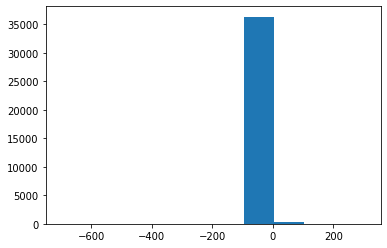

In [7]:
# minimum_minimum_nighths: 35,664 obs. show the same value as minimum_nights
minN_minus_minMinN = listings_reduced.minimum_nights - listings_reduced.minimum_minimum_nights
minN_minus_minMinN.unique()
minN_minus_minMinN.value_counts()

plt.hist(minN_minus_minMinN)

array([   0.,   -2.,  -29.,  -17.,   -3.,   -1.,  -55.,   -4.,    3.,
         -9.,  -15.,  -25.,  -90.,   -5.,  -21.,  -13.,  -28.,  -27.,
        -11.,    2., -120.,  -60.,   60.,    1.,  -75.,  -80.,  -16.,
        -10.,  -20.,  -23.,   -6.,  -45.,   -8.,    7.,  -70.,  -26.,
         -7.,  -87.,  -86., -700.,  -19.,  -56., -176.,   23.,  -14.,
       -100., -640.,   28., -115., -113.,  -30.,  -43.,   29.,   nan,
        -59.,  -40., -670.,  -89.,  -49.])

 0.0      35142
-1.0        604
-700.0      281
-2.0        197
-3.0         75
-60.0        51
-27.0        46
-6.0         45
-29.0        29
-30.0        27
-4.0         24
-5.0         23
 1.0         15
-45.0        15
-7.0         13
-28.0         9
-26.0         8
-25.0         8
-11.0         7
-16.0         7
-8.0          6
-87.0         5
-86.0         5
-640.0        4
-10.0         4
-23.0         4
-9.0          4
-13.0         4
 2.0          3
 3.0          3
-21.0         3
-15.0         2
-14.0         2
-75.0         2
 29.0         2
-19.0         2
 28.0         2
-59.0         2
-70.0         2
 60.0         2
-115.0        1
-40.0         1
-670.0        1
-43.0         1
-89.0         1
-17.0         1
-113.0        1
-80.0         1
-176.0        1
-55.0         1
-100.0        1
 23.0         1
-56.0         1
-90.0         1
 7.0          1
-120.0        1
-20.0         1
-49.0         1
dtype: int64

(array([2.8600e+02, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 1.0000e+00, 4.0000e+00, 2.2800e+02, 3.6188e+04]),
 array([-700., -624., -548., -472., -396., -320., -244., -168.,  -92.,
         -16.,   60.]),
 <BarContainer object of 10 artists>)

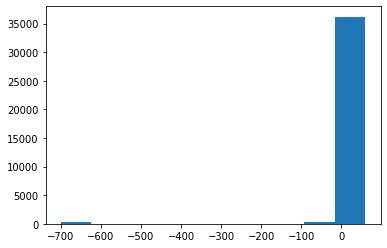

In [8]:
# maximum_minimum_nighths: 35,142 obs. show the same value as minimum_nights
minN_minus_maxMinN = listings_reduced.minimum_nights - listings_reduced.maximum_minimum_nights
minN_minus_maxMinN.unique()
minN_minus_maxMinN.value_counts()

plt.hist(minN_minus_maxMinN)

array([ 0.000e+00, -1.000e-01, -7.300e+00, -2.000e-01,  1.000e-01,
       -1.300e+00,  1.000e+00, -1.220e+01, -3.000e-01,  2.000e-01,
       -2.390e+01,  1.000e-01,  5.000e-01, -3.000e-01,  1.000e-01,
        3.000e-01, -1.000e-01,  3.000e+00,  5.700e+00,  3.000e-01,
       -1.500e+01,  1.700e+00,  3.000e-01, -4.000e-01,  2.000e-01,
       -2.200e+00,  7.000e-01, -3.530e+01, -9.000e-01,  4.000e-01,
        6.400e+00, -1.800e+00, -8.000e-01, -6.000e-01, -7.000e+00,
        8.200e+00, -5.000e-01, -1.900e+00,  1.000e-01,  1.500e+00,
        9.000e-01, -1.000e-01, -7.000e-01,  3.920e+01,  6.000e-01,
        5.900e+00,  1.300e+00,  2.000e+00, -1.096e+02,  3.100e+00,
       -2.000e-01, -2.510e+01,  6.000e+01,  3.900e+00,  6.000e-01,
       -8.000e-01, -3.060e+01,  6.000e-01, -1.700e+00, -3.350e+01,
        1.700e+00, -4.000e-01, -4.700e+00, -1.000e+00, -9.800e+00,
        7.000e-01, -1.500e+00, -1.160e+01, -2.230e+01, -5.300e+00,
       -7.000e-01, -7.100e+00,  7.400e+00,  2.050e+01, -3.200e

 0.0      34935
-0.1        110
 0.5         90
-0.3         78
 0.1         73
          ...  
-677.7        1
-670.8        1
-0.7          1
-669.0        1
-4.8          1
Length: 309, dtype: int64

(array([2.8500e+02, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 1.0000e+00, 3.5000e+01, 3.6377e+04, 8.0000e+00]),
 array([-700.  , -617.22, -534.44, -451.66, -368.88, -286.1 , -203.32,
        -120.54,  -37.76,   45.02,  127.8 ]),
 <BarContainer object of 10 artists>)

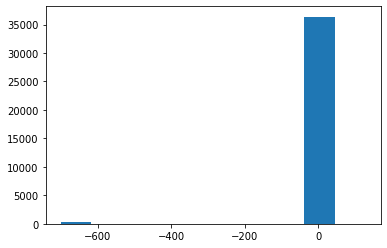

In [9]:
# minimumnights_avg_ntm: 34,935 obs. show the same value as minimum_nights
minN_minus_minNAvg = listings_reduced.minimum_nights - listings_reduced.minimum_nights_avg_ntm
minN_minus_minNAvg.unique()
minN_minus_minNAvg.value_counts()

plt.hist(minN_minus_minNAvg)

array([ 0.00000000e+00, -3.95000000e+02, -4.25000000e+02, -1.09500000e+03,
       -1.06500000e+03, -1.09600000e+03, -9.75000000e+02, -1.10000000e+03,
       -7.60000000e+02, -1.03500000e+03,  3.00000000e+01, -1.08000000e+03,
       -1.10400000e+03, -1.09800000e+03, -1.00000000e+00, -9.43000000e+02,
       -8.25000000e+02, -8.55000000e+02,  3.37000000e+02, -1.05500000e+03,
       -1.11100000e+03, -1.09700000e+03, -7.65000000e+02, -1.00500000e+03,
       -1.09400000e+03, -1.12200000e+03, -9.45000000e+02, -1.11300000e+03,
        6.00000000e+00, -1.12000000e+03,  5.00000000e+00, -1.08500000e+03,
       -6.00000000e+01, -1.11700000e+03, -1.11800000e+03, -1.10700000e+03,
       -1.10500000e+03, -1.09300000e+03,  1.03500000e+03, -1.11000000e+03,
        5.60000000e+01, -8.85000000e+02, -1.06400000e+03, -1.09000000e+03,
       -1.11500000e+03, -9.39000000e+02, -7.25000000e+02,  8.00000000e+00,
       -1.02500000e+03,  1.46000000e+02, -9.25000000e+02,  1.09500000e+03,
       -1.06600000e+03, -

 0.0       30725
-1095.0      810
-760.0       609
-1035.0      416
-1065.0      368
           ...  
-1052.0        1
-937.0         1
-990.0         1
-123.0         1
 362.0         1
Length: 259, dtype: int64

(array([3.6000e+01, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 3.6671e+04]),
 array([-2.14748362e+09, -1.93273514e+09, -1.71798667e+09, -1.50323819e+09,
        -1.28848972e+09, -1.07374125e+09, -8.58992772e+08, -6.44244298e+08,
        -4.29495824e+08, -2.14747350e+08,  1.12400000e+03]),
 <BarContainer object of 10 artists>)

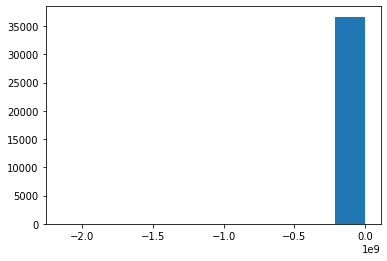

In [10]:
# minimum_maximum_nighths: 30,725 obs. show the same value as maximum_nights
maxN_minus_minMaxN = listings_reduced.maximum_nights - listings_reduced.minimum_maximum_nights
maxN_minus_minMaxN.unique()
maxN_minus_minMaxN.value_counts()

plt.hist(maxN_minus_minMaxN)

array([ 0.00000000e+00, -3.95000000e+02, -4.25000000e+02, -1.09500000e+03,
       -1.06500000e+03, -1.09600000e+03, -9.75000000e+02, -1.10000000e+03,
       -7.60000000e+02, -1.03500000e+03, -1.08000000e+03, -1.10400000e+03,
       -1.09800000e+03, -1.00000000e+00, -9.43000000e+02, -8.25000000e+02,
       -8.55000000e+02, -1.05500000e+03, -1.11100000e+03, -1.09700000e+03,
       -7.65000000e+02, -1.00500000e+03, -1.09400000e+03, -1.12200000e+03,
       -9.45000000e+02, -1.11300000e+03, -1.12000000e+03, -1.08500000e+03,
       -1.11700000e+03, -1.11800000e+03, -1.10700000e+03, -1.10500000e+03,
       -1.09300000e+03, -1.11000000e+03, -8.85000000e+02, -1.06400000e+03,
       -1.09000000e+03, -1.11500000e+03, -1.11400000e+03, -9.39000000e+02,
       -7.25000000e+02, -1.02500000e+03, -9.25000000e+02, -1.06600000e+03,
       -9.44000000e+02, -6.45000000e+02, -1.03200000e+03, -1.25000000e+02,
       -9.15000000e+02, -1.07000000e+03, -7.59000000e+02, -1.06300000e+03,
       -1.10800000e+03, -

 0.0       30885
-1095.0      822
-760.0       612
-1097.0      424
-1035.0      420
           ...  
-1068.0        1
-970.0         1
-1053.0        1
-1067.0        1
-865.0         1
Length: 209, dtype: int64

(array([   62.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
            0., 36645.]),
 array([-2.14748363e+09, -1.93273515e+09, -1.71798668e+09, -1.50323821e+09,
        -1.28848973e+09, -1.07374126e+09, -8.58992784e+08, -6.44244311e+08,
        -4.29495837e+08, -2.14747364e+08,  1.11000000e+03]),
 <BarContainer object of 10 artists>)

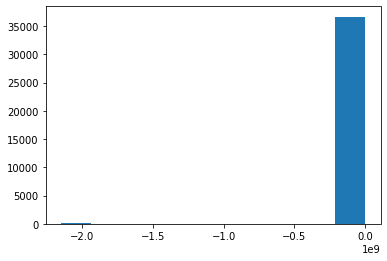

In [11]:
# maximum_maximum_nighths: 30,885 obs. show the same value as maximum_nights
maxN_minus_maxMaxN = listings_reduced.maximum_nights - listings_reduced.maximum_maximum_nights
maxN_minus_maxMaxN.unique()
maxN_minus_maxMaxN.value_counts()

plt.hist(maxN_minus_maxMaxN)

array([ 0.00000000e+00, -3.95000000e+02, -4.25000000e+02, -1.09500000e+03,
       -1.06500000e+03, -1.09600000e+03, -9.75000000e+02, -1.10000000e+03,
       -7.60000000e+02, -1.03500000e+03,  7.50000000e+00, -1.08000000e+03,
       -1.10400000e+03, -1.09800000e+03, -1.00000000e+00, -9.43000000e+02,
       -8.25000000e+02, -8.55000000e+02, -6.80000000e+02, -1.05500000e+03,
       -1.11100000e+03, -1.09700000e+03, -7.65000000e+02, -1.00500000e+03,
       -1.09400000e+03, -1.12200000e+03, -9.45000000e+02, -1.11300000e+03,
        1.00000000e-01, -1.12000000e+03,  1.20000000e+00, -1.08500000e+03,
       -8.61300000e+02, -1.11700000e+03, -1.11800000e+03, -1.10700000e+03,
       -1.10500000e+03, -1.09300000e+03, -1.00340000e+03,  7.31000000e+01,
       -1.11000000e+03,  1.10000000e+00, -8.85000000e+02, -1.10470000e+03,
       -1.06400000e+03, -1.09000000e+03, -1.11500000e+03, -1.08610000e+03,
       -9.39000000e+02, -7.25000000e+02, -1.10250000e+03, -1.02500000e+03,
        2.38000000e+01, -

 0.0       30623
-1095.0      810
-760.0       607
-1035.0      416
-1065.0      368
           ...  
 5.2           1
 5.9           1
 1.5           1
-840.4         1
 284.5         1
Length: 429, dtype: int64

(array([4.5000e+01, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 1.1000e+01, 5.0000e+00, 0.0000e+00, 3.6646e+04]),
 array([-2.14748362e+09, -1.93273514e+09, -1.71798667e+09, -1.50323820e+09,
        -1.28848973e+09, -1.07374125e+09, -8.58992781e+08, -6.44244308e+08,
        -4.29495835e+08, -2.14747363e+08,  1.11000000e+03]),
 <BarContainer object of 10 artists>)

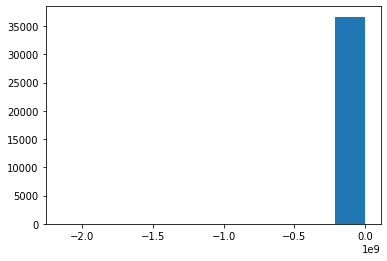

In [12]:
# maximum_nighths_avg_ntm: 30,623 obs. show the same value as maximum_nights
maxN_minus_maxNAvg = listings_reduced.maximum_nights - listings_reduced.maximum_nights_avg_ntm
maxN_minus_maxNAvg.unique()
maxN_minus_maxNAvg.value_counts()

plt.hist(maxN_minus_maxNAvg)

In [13]:
# Replace all Min_xx/Max_xx night with Min_nights/Max_nights
listings_reduced.minimum_minimum_nights.fillna(listings_reduced.minimum_nights, inplace=True)
listings_reduced.maximum_minimum_nights.fillna(listings_reduced.minimum_nights, inplace=True)
listings_reduced.minimum_nights_avg_ntm.fillna(listings_reduced.minimum_nights, inplace=True)
listings_reduced.minimum_maximum_nights.fillna(listings_reduced.maximum_nights, inplace=True)
listings_reduced.maximum_maximum_nights.fillna(listings_reduced.maximum_nights, inplace=True)
listings_reduced.maximum_nights_avg_ntm.fillna(listings_reduced.maximum_nights, inplace=True)

listings_reduced.isna().sum()

/Users/puri/opt/anaconda3/envs/ML7331/lib/python3.8/site-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


id                                                  0
host_id                                             0
host_name                                          23
host_since                                         23
host_response_time                              15676
host_response_rate                              15676
host_acceptance_rate                            15186
host_is_superhost                                  23
host_neighbourhood                               6871
host_listings_count                                23
host_total_listings_count                          23
host_verifications                                  0
host_has_profile_pic                               23
host_identity_verified                             23
neighbourhood                                   14132
neighbourhood_cleansed                              0
neighbourhood_group_cleansed                        0
latitude                                            0
longitude                   

In [15]:
listings_reduced.review_scores_rating.describe()

count    27309.000000
mean         4.574993
std          0.863975
min          0.000000
25%          4.560000
50%          4.820000
75%          5.000000
max          5.000000
Name: review_scores_rating, dtype: float64

(array([6.3900e+02, 0.0000e+00, 1.6800e+02, 6.0000e+00, 9.3000e+01,
        4.6000e+01, 4.0500e+02, 3.8200e+02, 3.4340e+03, 2.2136e+04]),
 array([0. , 0.5, 1. , 1.5, 2. , 2.5, 3. , 3.5, 4. , 4.5, 5. ]),
 <BarContainer object of 10 artists>)

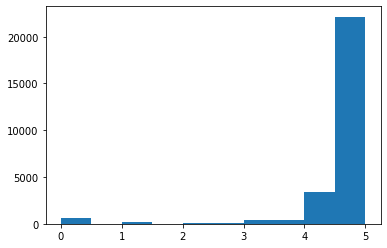

In [16]:
plt.hist(listings_reduced.review_scores_rating)

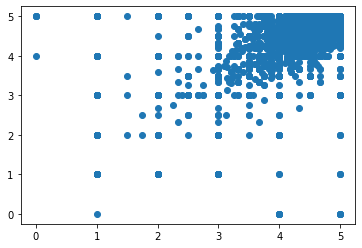

In [17]:
plt.plot(listings_reduced.review_scores_rating,listings_reduced.review_scores_checkin, 'o')

inimum_maximum_nights                                      0.001774   
maximum_maximum_nights                                      0.001360   
minimum_nights_avg_ntm                                      0.008092   
maximum_nights_avg_ntm                                      0.003022   
availability_30                                            -0.098142   
availability_60                                            -0.109780   
availability_90                                            -0.107738   
availability_365                                           -0.083265   
number_of_reviews                                          -0.000081   
number_of_reviews_ltm                                       0.022318   
number_of_reviews_l30d                                      0.022340   
review_scores_rating                                        0.561047   
review_scores_accuracy                                      0.549915   
review_scores_cleanliness                                   0.468

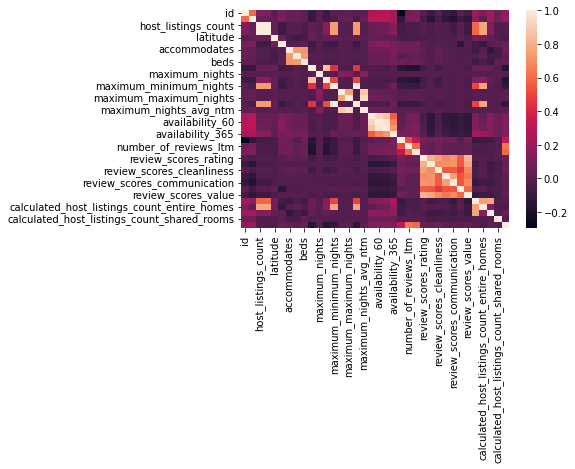

In [18]:
print(listings_reduced.corr())
  
# plotting correlation heatmap
dataplot = sns.heatmap(listings_reduced.corr())
  
# displaying heatmap
plt.show()

In [19]:
# There are no strong correlations between reviews scores and other variables, so the team decided to replace null value with its mean.

# Replace Review Score by its mean
listings_reduced.review_scores_rating.fillna(listings_reduced.review_scores_rating.mean(), inplace=True)
listings_reduced.review_scores_accuracy.fillna(listings_reduced.review_scores_accuracy.mean(), inplace=True)
listings_reduced.review_scores_cleanliness.fillna(listings_reduced.review_scores_cleanliness.mean(), inplace=True)
listings_reduced.review_scores_checkin.fillna(listings_reduced.review_scores_checkin.mean(), inplace=True)
listings_reduced.review_scores_communication.fillna(listings_reduced.review_scores_communication.mean(), inplace=True)
listings_reduced.review_scores_location.fillna(listings_reduced.review_scores_location.mean(), inplace=True)
listings_reduced.review_scores_value.fillna(listings_reduced.review_scores_value.mean(), inplace=True)

listings_reduced.isna().sum()

/Users/puri/opt/anaconda3/envs/ML7331/lib/python3.8/site-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


id                                                  0
host_id                                             0
host_name                                          23
host_since                                         23
host_response_time                              15676
host_response_rate                              15676
host_acceptance_rate                            15186
host_is_superhost                                  23
host_neighbourhood                               6871
host_listings_count                                23
host_total_listings_count                          23
host_verifications                                  0
host_has_profile_pic                               23
host_identity_verified                             23
neighbourhood                                   14132
neighbourhood_cleansed                              0
neighbourhood_group_cleansed                        0
latitude                                            0
longitude                   

In [20]:
# Note: reviews_per_month seem to be calcualted from (08/04/2021 - first_review)/number_of_reviews

# All null review_per_month has 0 number_of_reviews
review_pMonth_vs_numReview = listings_reduced[listings_reduced['reviews_per_month'].isnull()]
review_pMonth_vs_numReview = review_pMonth_vs_numReview[['number_of_reviews', 'reviews_per_month']]

review_pMonth_vs_numReview.number_of_reviews.unique()

array([0])

In [21]:
# Replace null value for review_per_month with 0
listings_reduced.reviews_per_month = listings_reduced.reviews_per_month.fillna(0)

listings_reduced.isna().sum()

/Users/puri/opt/anaconda3/envs/ML7331/lib/python3.8/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


id                                                  0
host_id                                             0
host_name                                          23
host_since                                         23
host_response_time                              15676
host_response_rate                              15676
host_acceptance_rate                            15186
host_is_superhost                                  23
host_neighbourhood                               6871
host_listings_count                                23
host_total_listings_count                          23
host_verifications                                  0
host_has_profile_pic                               23
host_identity_verified                             23
neighbourhood                                   14132
neighbourhood_cleansed                              0
neighbourhood_group_cleansed                        0
latitude                                            0
longitude                   

count    36724.000000
mean        29.407172
std        181.413150
min          0.000000
25%          1.000000
50%          1.000000
75%          3.000000
max       3966.000000
Name: host_listings_count, dtype: float64

0    1.0
dtype: float64

1.0      17048
2.0       4944
0.0       4693
3.0       2188
4.0       1154
         ...  
206.0        1
49.0         1
37.0         1
33.0         1
512.0        1
Name: host_listings_count, Length: 89, dtype: int64

count    36724.000000
mean        29.407172
std        181.413150
min          0.000000
25%          1.000000
50%          1.000000
75%          3.000000
max       3966.000000
Name: host_total_listings_count, dtype: float64

0    1.0
dtype: float64

1.0      17048
2.0       4944
0.0       4693
3.0       2188
4.0       1154
         ...  
206.0        1
49.0         1
37.0         1
33.0         1
512.0        1
Name: host_total_listings_count, Length: 89, dtype: int64

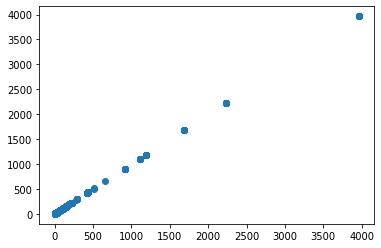

In [32]:
# host_listings_count and host_total_listings_count are the same number (from scatter plot)
# Mode of the variables is 1

plt.plot(listings_reduced.host_listings_count,listings_reduced.host_total_listings_count, 'o')

listings_reduced.host_listings_count.describe()
listings_reduced.host_listings_count.mode()
listings_reduced.host_listings_count.value_counts()

listings_reduced.host_total_listings_count.describe()
listings_reduced.host_total_listings_count.mode()
listings_reduced.host_total_listings_count.value_counts()

In [23]:
# Replace null value for host_listings_count and host_total_listings_count with its mode
listings_reduced.host_listings_count.fillna(listings_reduced.host_listings_count.mode()[0], inplace=True)
listings_reduced.host_total_listings_count.fillna(listings_reduced.host_total_listings_count.mode()[0], inplace=True)

listings_reduced.isna().sum()

/Users/puri/opt/anaconda3/envs/ML7331/lib/python3.8/site-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


id                                                  0
host_id                                             0
host_name                                          23
host_since                                         23
host_response_time                              15676
host_response_rate                              15676
host_acceptance_rate                            15186
host_is_superhost                                  23
host_neighbourhood                               6871
host_listings_count                                 0
host_total_listings_count                           0
host_verifications                                  0
host_has_profile_pic                               23
host_identity_verified                             23
neighbourhood                                   14132
neighbourhood_cleansed                              0
neighbourhood_group_cleansed                        0
latitude                                            0
longitude                   

In [26]:
# Convert host_response_rate to float (0-1)
listings_reduced.host_response_rate.unique()

listings_reduced['host_response_rate'] = listings_reduced['host_response_rate'].replace('[%]', '', regex=True)
listings_reduced['host_response_rate'] = listings_reduced['host_response_rate'].astype(float)/100
listings_reduced.host_response_rate.unique()

array([nan, '50', '100', '88', '97', '70', '90', '95', '89', '80', '86',
       '96', '10', '0', '81', '60', '82', '17', '83', '75', '67', '85',
       '33', '99', '78', '92', '14', '94', '20', '63', '25', '64', '30',
       '47', '91', '98', '44', '39', '42', '87', '71', '65', '22', '43',
       '40', '57', '93', '76', '77', '56', '38', '62', '58', '36', '13',
       '24', '5', '11', '15', '69', '52', '61', '27', '16', '79', '74',
       '73', '59', '18', '29', '84', '54', '8', '72', '12', '66', '68',
       '55', '9', '53', '21', '46', '6', '2', '7', '32', '48', '19', '4',
       '23', '28'], dtype=object)

/var/folders/vz/68jlc85d78vcqcr5gx1r56l40000gn/T/ipykernel_71615/4018838670.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  listings_reduced['host_response_rate'] = listings_reduced['host_response_rate'].replace('[%]', '', regex=True)
/var/folders/vz/68jlc85d78vcqcr5gx1r56l40000gn/T/ipykernel_71615/4018838670.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  listings_reduced['host_response_rate'] = listings_reduced['host_response_rate'].astype(float)/100


array([ nan, 0.5 , 1.  , 0.88, 0.97, 0.7 , 0.9 , 0.95, 0.89, 0.8 , 0.86,
       0.96, 0.1 , 0.  , 0.81, 0.6 , 0.82, 0.17, 0.83, 0.75, 0.67, 0.85,
       0.33, 0.99, 0.78, 0.92, 0.14, 0.94, 0.2 , 0.63, 0.25, 0.64, 0.3 ,
       0.47, 0.91, 0.98, 0.44, 0.39, 0.42, 0.87, 0.71, 0.65, 0.22, 0.43,
       0.4 , 0.57, 0.93, 0.76, 0.77, 0.56, 0.38, 0.62, 0.58, 0.36, 0.13,
       0.24, 0.05, 0.11, 0.15, 0.69, 0.52, 0.61, 0.27, 0.16, 0.79, 0.74,
       0.73, 0.59, 0.18, 0.29, 0.84, 0.54, 0.08, 0.72, 0.12, 0.66, 0.68,
       0.55, 0.09, 0.53, 0.21, 0.46, 0.06, 0.02, 0.07, 0.32, 0.48, 0.19,
       0.04, 0.23, 0.28])

In [27]:
# Convert host_acceptance_rate to float (0-1)
listings_reduced.host_acceptance_rate.unique()

listings_reduced['host_acceptance_rate'] = listings_reduced['host_acceptance_rate'].replace('[%]', '', regex=True)
listings_reduced['host_acceptance_rate'] = listings_reduced['host_acceptance_rate'].astype(float)/100
listings_reduced.host_acceptance_rate.unique()


array([nan, '88%', '33%', '100%', '0%', '17%', '65%', '98%', '71%', '86%',
       '72%', '95%', '75%', '80%', '90%', '77%', '20%', '8%', '43%',
       '12%', '78%', '59%', '94%', '50%', '73%', '21%', '60%', '36%',
       '93%', '63%', '67%', '97%', '76%', '5%', '35%', '81%', '48%', '6%',
       '40%', '96%', '99%', '87%', '89%', '44%', '38%', '25%', '83%',
       '92%', '82%', '53%', '27%', '85%', '34%', '84%', '91%', '22%',
       '52%', '69%', '32%', '54%', '64%', '29%', '24%', '42%', '57%',
       '11%', '19%', '55%', '51%', '56%', '79%', '13%', '39%', '41%',
       '62%', '30%', '61%', '58%', '47%', '70%', '26%', '23%', '18%',
       '45%', '28%', '9%', '68%', '10%', '3%', '16%', '14%', '15%', '37%',
       '66%', '46%', '74%', '49%', '2%', '7%', '31%', '4%'], dtype=object)

/var/folders/vz/68jlc85d78vcqcr5gx1r56l40000gn/T/ipykernel_71615/3502360053.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  listings_reduced['host_acceptance_rate'] = listings_reduced['host_acceptance_rate'].replace('[%]', '', regex=True)
/var/folders/vz/68jlc85d78vcqcr5gx1r56l40000gn/T/ipykernel_71615/3502360053.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  listings_reduced['host_acceptance_rate'] = listings_reduced['host_acceptance_rate'].astype(float)/100


array([ nan, 0.88, 0.33, 1.  , 0.  , 0.17, 0.65, 0.98, 0.71, 0.86, 0.72,
       0.95, 0.75, 0.8 , 0.9 , 0.77, 0.2 , 0.08, 0.43, 0.12, 0.78, 0.59,
       0.94, 0.5 , 0.73, 0.21, 0.6 , 0.36, 0.93, 0.63, 0.67, 0.97, 0.76,
       0.05, 0.35, 0.81, 0.48, 0.06, 0.4 , 0.96, 0.99, 0.87, 0.89, 0.44,
       0.38, 0.25, 0.83, 0.92, 0.82, 0.53, 0.27, 0.85, 0.34, 0.84, 0.91,
       0.22, 0.52, 0.69, 0.32, 0.54, 0.64, 0.29, 0.24, 0.42, 0.57, 0.11,
       0.19, 0.55, 0.51, 0.56, 0.79, 0.13, 0.39, 0.41, 0.62, 0.3 , 0.61,
       0.58, 0.47, 0.7 , 0.26, 0.23, 0.18, 0.45, 0.28, 0.09, 0.68, 0.1 ,
       0.03, 0.16, 0.14, 0.15, 0.37, 0.66, 0.46, 0.74, 0.49, 0.02, 0.07,
       0.31, 0.04])

count    21048.000000
mean         0.863310
std          0.272092
min          0.000000
25%          0.900000
50%          1.000000
75%          1.000000
max          1.000000
Name: host_response_rate, dtype: float64

0    1.0
dtype: float64

count    21538.000000
mean         0.756196
std          0.304191
min          0.000000
25%          0.640000
50%          0.890000
75%          0.990000
max          1.000000
Name: host_acceptance_rate, dtype: float64

0    1.0
dtype: float64

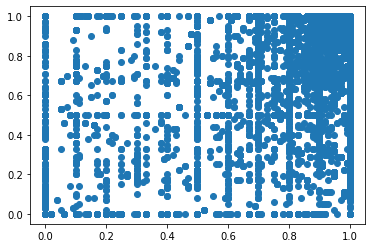

In [28]:
plt.plot(listings_reduced.host_response_rate,listings_reduced.host_acceptance_rate, 'o')

listings_reduced.host_response_rate.describe()
listings_reduced.host_response_rate.mode()

listings_reduced.host_acceptance_rate.describe()
listings_reduced.host_acceptance_rate.mode()

In [29]:
# Replace host_response/acceptance_rate_percent by its mean

listings_reduced.host_response_rate.fillna(listings_reduced.host_response_rate.mean(), inplace=True)
listings_reduced.host_acceptance_rate.fillna(listings_reduced.host_acceptance_rate.mean(), inplace=True)

/Users/puri/opt/anaconda3/envs/ML7331/lib/python3.8/site-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


In [30]:
listings_reduced.isna().sum()


id                                                  0
host_id                                             0
host_name                                          23
host_since                                         23
host_response_time                              15676
host_response_rate                                  0
host_acceptance_rate                                0
host_is_superhost                                  23
host_neighbourhood                               6871
host_listings_count                                 0
host_total_listings_count                           0
host_verifications                                  0
host_has_profile_pic                               23
host_identity_verified                             23
neighbourhood                                   14132
neighbourhood_cleansed                              0
neighbourhood_group_cleansed                        0
latitude                                            0
longitude                   

In [31]:
listings_reduced.host_acceptance_rate.value_counts()

0.756196    15186
1.000000     5321
0.000000     1474
0.990000     1049
0.980000      795
            ...  
0.120000        9
0.020000        9
0.060000        8
0.030000        7
0.490000        5
Name: host_acceptance_rate, Length: 101, dtype: int64